# 1. Data Importing and Cleaning:

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the dataset
data = pd.read_csv('nearest-earth-objects(1910-2024).csv')
data.head()

,neo_id,name,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,orbiting_body,relative_velocity,miss_distance,is_hazardous
0,2162117,162117 (1998 SD15),19.14,0.394962,0.883161,Earth,71745.401048,5.814362e+07,False
1,2349507,349507 (2008 QY),18.50,0.530341,1.185878,Earth,109949.757148,5.580105e+07,True
2,2455415,455415 (2003 GA),21.45,0.136319,0.304818,Earth,24865.506798,6.720689e+07,False
3,3132126,(2002 PB),20.63,0.198863,0.444672,Earth,78890.076805,3.039644e+07,False
4,3557844,(2011 DW),22.70,0.076658,0.171412,Earth,56036.519484,6.311863e+07,False


In [4]:
data.shape

(338199, 9)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338199 entries, 0 to 338198
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   neo_id                  338199 non-null  int64  
 1   name                    338199 non-null  object 
 2   absolute_magnitude      338171 non-null  float64
 3   estimated_diameter_min  338171 non-null  float64
 4   estimated_diameter_max  338171 non-null  float64
 5   orbiting_body           338199 non-null  object 
 6   relative_velocity       338199 non-null  float64
 7   miss_distance           338199 non-null  float64
 8   is_hazardous            338199 non-null  bool   
dtypes: bool(1), float64(5), int64(1), object(2)
memory usage: 21.0+ MB


In [6]:
data.describe()

,neo_id,absolute_magnitude,estimated_diameter_min,estimated_diameter_max,relative_velocity,miss_distance
count,3.381990e+05,338171.000000,338171.000000,338171.000000,338199.000000,3.381990e+05
mean,1.759939e+07,22.932525,0.157812,0.352878,51060.662908,4.153535e+07
std,2.287225e+07,2.911216,0.313885,0.701869,26399.238435,2.077399e+07
min,2.000433e+06,9.250000,0.000511,0.001143,203.346433,6.745533e+03
25%,3.373980e+06,20.740000,0.025384,0.056760,30712.031471,2.494540e+07
50%,3.742127e+06,22.800000,0.073207,0.163697,47560.465474,4.332674e+07
75%,5.405374e+07,25.100000,0.189041,0.422708,66673.820614,5.933961e+07
max,5.446281e+07,33.580000,37.545248,83.953727,291781.106613,7.479865e+07


In [4]:
# Check for missing values
data.isnull().sum() / len(data)

neo_id                    0.000000
name                      0.000000
absolute_magnitude        0.000083
estimated_diameter_min    0.000083
estimated_diameter_max    0.000083
orbiting_body             0.000000
relative_velocity         0.000000
miss_distance             0.000000
is_hazardous              0.000000
dtype: float64

<Axes: >

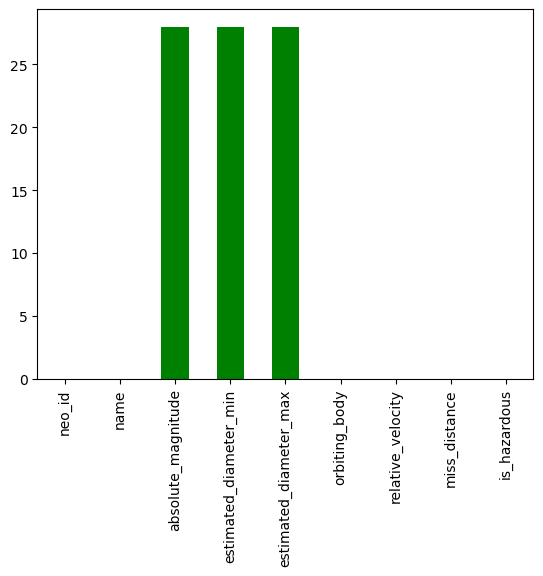

In [10]:
# check null values
data.isna().sum().plot(kind='bar',color='green')

In [9]:
# check duplicate values
data.duplicated().sum()

0

In [7]:
# Handle missing values by filling with the mean for numerical columns
data.dropna(inplace=True)

# 2. Exploratory Data Analysis (EDA): 

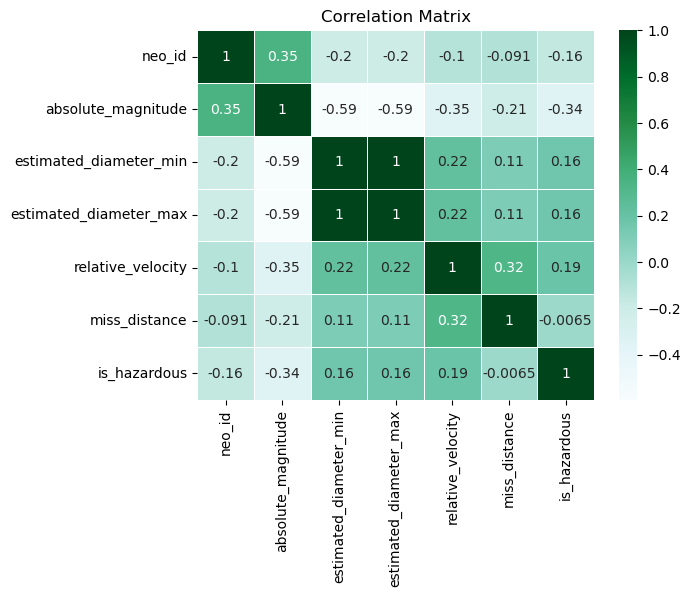

In [9]:
# show correlations between data features
numeric_features = data.select_dtypes(exclude='object')
corr = numeric_features.corr()
sns.heatmap(corr,annot=True,linewidths=.5,cmap="BuGn")
plt.title('Correlation Matrix')
plt.show()

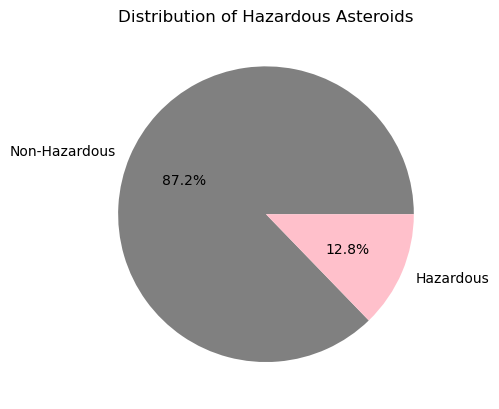

In [14]:
# Visulaize the target label
plt.pie(data['is_hazardous'].value_counts(),labels=['Non-Hazardous', 'Hazardous'],autopct='%1.1f%%',colors=['grey','pink'])
plt.title('Distribution of Hazardous Asteroids')
plt.show()

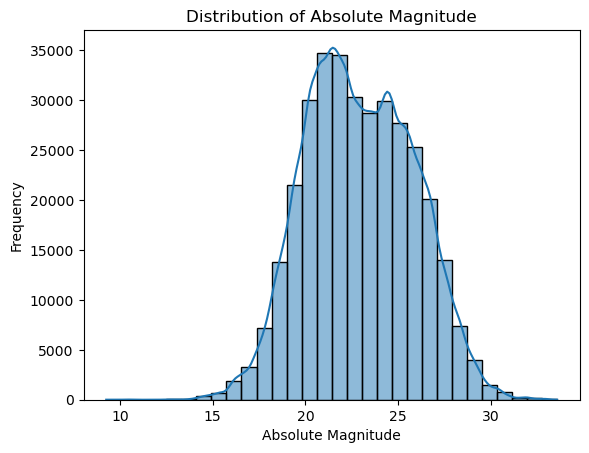

In [15]:
#  Distribution of absolute_magnitude
sns.histplot(data['absolute_magnitude'],bins=30,kde=True)
plt.title('Distribution of Absolute Magnitude')
plt.xlabel('Absolute Magnitude')
plt.ylabel('Frequency')
plt.show()

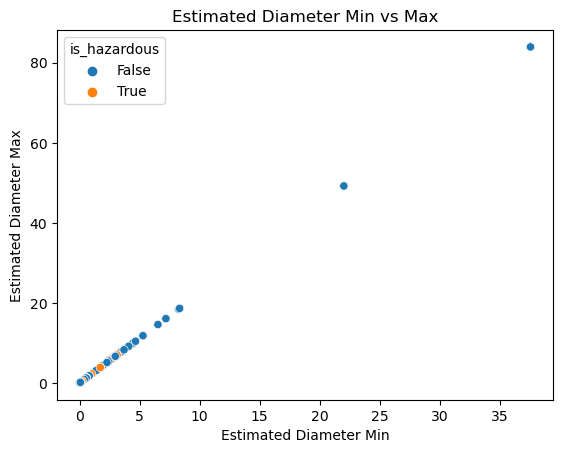

In [16]:
#  relationship between estimated_diameter_min and estimated_diameter_max
sns.scatterplot(x=data['estimated_diameter_min'],y=data['estimated_diameter_max'],hue=data['is_hazardous'],data=data)
plt.title('Estimated Diameter Min vs Max')
plt.xlabel('Estimated Diameter Min')
plt.ylabel('Estimated Diameter Max')
plt.show()

In [17]:
# interactive plot between relative velocity and miss distance
fig = px.scatter(data,x='relative_velocity',y='miss_distance',color='is_hazardous',title='Relative Velocity Vs Miss Distance')
fig.show()

# 3. Data Preprocessing:

In [10]:
# Feature selection
X = data.drop(['neo_id', 'name', 'is_hazardous','orbiting_body'], axis=1)
y = data['is_hazardous']

In [11]:
# Handle imbalanced classes using SMOTE
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [12]:
# Split the data into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)

In [13]:
# Standardize the numerical features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# 4. Model Training and Evaluation:

In [14]:
# Train a Logistic Regression model
from sklearn.linear_model import LogisticRegression
log_res = LogisticRegression(random_state=42)
log_res.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [15]:
# Predict and evaluate the Logistic Regression model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, roc_auc_score
y_log_pred = log_res.predict(X_test)
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_log_pred))
print("Logistic Regression Report:")
print(classification_report(y_test, y_log_pred))

Confusion Matrix:
[[63367 25010]
 [ 8576 80053]]
Logistic Regression Report:
              precision    recall  f1-score   support

       False       0.88      0.72      0.79     88377
        True       0.76      0.90      0.83     88629

    accuracy                           0.81    177006
   macro avg       0.82      0.81      0.81    177006
weighted avg       0.82      0.81      0.81    177006



In [16]:
log_accuracy = roc_auc_score(y_test, y_log_pred) *100
print(f"Logistic Regression ROC AUC Score: {log_accuracy:.2f} %")

Logistic Regression ROC AUC Score: 81.01 %


In [19]:
# Train a Decision Tree Model
from sklearn.tree import DecisionTreeClassifier
tree_model = DecisionTreeClassifier(max_depth=16,random_state=42)
tree_model.fit(X_resampled,y_resampled)

DecisionTreeClassifier(max_depth=16, random_state=42)

In [20]:
# predict and evaluate decision tree model
y_tree_pred = tree_model.predict(X_test)
print("Confusion Matrix")
print(confusion_matrix(y_test,y_tree_pred))
print("Classification Report")
print(classification_report(y_test,y_tree_pred))

Confusion Matrix
[[74903 13474]
 [52429 36200]]
Classification Report
              precision    recall  f1-score   support

       False       0.59      0.85      0.69     88377
        True       0.73      0.41      0.52     88629

    accuracy                           0.63    177006
   macro avg       0.66      0.63      0.61    177006
weighted avg       0.66      0.63      0.61    177006



In [21]:
# Calculate ROC AUC score
tree_accu = roc_auc_score(y_test, y_tree_pred) *100
print(f"Decision Tree ROC AUC Score: {tree_accu:.2f} %")

Decision Tree ROC AUC Score: 62.80 %


In [22]:
# Train a Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
rand_model = RandomForestClassifier(random_state=42)
rand_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [23]:
# Predict and evaluate the Random Forest model
y_rand_pred = rand_model.predict(X_test)
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_rand_pred))
print("Random Forest Classifier Report:")
print(classification_report(y_test, y_rand_pred))

Confusion Matrix:
[[84269  4108]
 [ 4801 83828]]
Random Forest Classifier Report:
              precision    recall  f1-score   support

       False       0.95      0.95      0.95     88377
        True       0.95      0.95      0.95     88629

    accuracy                           0.95    177006
   macro avg       0.95      0.95      0.95    177006
weighted avg       0.95      0.95      0.95    177006



In [24]:
rand_accuracy = roc_auc_score(y_test,y_rand_pred ) * 100
print(f"Random Forest ROC AUC Score: {rand_accuracy:.2f} %")

Random Forest ROC AUC Score: 94.97 %


# The Best Model

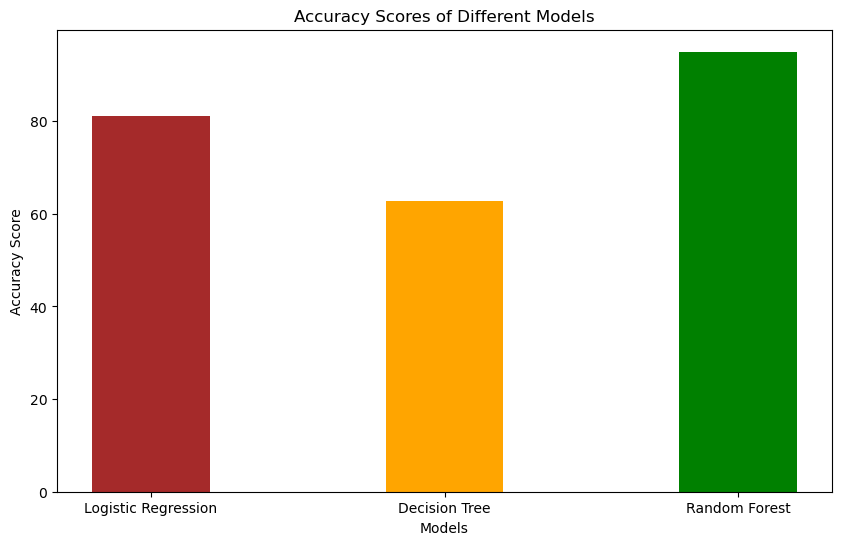

In [29]:
# Collect the accuracy scores for all models
model_names = ['Logistic Regression','Decision Tree', 'Random Forest']
accuracy_scores = [log_accuracy, tree_accu,rand_accuracy]

# Plot the accuracy scores
plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracy_scores, color=['brown', 'orange','green'],width=.4)
plt.xlabel('Models')
plt.ylabel('Accuracy Score')
plt.title('Accuracy Scores of Different Models')
plt.show()

In [30]:
print(f"The best model is {model_names[2]} with an accuracy score of {accuracy_scores[2]:.2f} %")

The best model is Random Forest with an accuracy score of 94.97 %
